This feature selection notebook does a filter followed by a wrapper for a binary dependent variable (binary classification). It's capable of doing the filter on more than one file. The variable files are called vars1.csv, vars2.csv ... Or you can make the input file name(s) anything you want.

The filter runs separately on each vars file and keeps the top num_filter variables from each file. If there are more than one vars files we'll again select the top num_filter variables across all the vars.csv files.

If balance = 0 the entire files are used. If balance != 0 then balance is the RATIO OF BADS TO GOODS retained for the rest of the feature selection. We keep all the rare class (bads) and downsample the goods. I think in general it's better to keep balance = 0.

The filter is pretty fast. The wrapper is what takes the most time. The two most important paramenters are the number of variables you want to save from the filter (num_filter) and the number you want from the wrapper (num_wrapper). 

There's a parameter njobs that controls the # threads used in the wrapper. Set it to 1 for a single thread and it should work fine, but you might be able to succeed with njobs = -1, which lets the machine set the maximum # threads based on the CPU. With this setting the kernel may die because of memory. The njobs = -1 doesn't take into consideration the memory requirements.

Recommendations: Try a few simple runs just to make sure all's working. Start with num_filter = 20, num_wrapper = 5, increase from there. I like num_filter as high as around 10 to 20% of the # candidate variables, but not much higher than a few hundred. You don't need num_wrapper large if you're doing forward selection. Most problems will saturate before 20. You can try a few different simple wrapper models like RF (5 trees, 10 layers), catboost (10 trees, 3 layers), LGBM (same). They're pretty fast. You can try forward and backward. I'd start with forward. In the end, select one of these as your favorite run and go with those variables. Don't mix variables across different runs.

I find forward selection runs much faster than backward.

Make sure your validation/out-of-time population and any other record exclusion is set correctly and as you want for your problem in cell 3.

In [1]:
import pandas as pd
import numpy as np
import scipy.stats as sps
import matplotlib.pyplot as plt
import datetime as dt
import gc
from sklearn.ensemble import RandomForestClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
%matplotlib inline
start_time = dt.datetime.now()

In [2]:
# set some parameters
num_files = 1 # This is number of files you have for feature selection. Usually this will just be 1.

# This is the number of variables from the filter that you want the wrapper to consider.
# Make it as high as your machine and time can handle. 
# I recommend set num_filter to be at least about 10 to 20% of the original # variables. 
num_filter = 600

# I recommend set num_wrapper to be about 30, then look for a saturation of the model performance as variables are added
# Then you can run it again with num_wrapper about twice this saturation number.
num_wrapper = 20

balance = 0 # a nonzero value will then be ratio of goods to bads.

# This is a cutpoint for measuring a detection rate. It's not that important to get it exact. 
# Set it around where you think the business cutoff is expected to be.
detect_rate = .03

index_name = 'record'  # set this string as whatever your record number field is called
y_name = 'fraud_label' # set this string to be whatever your binary label is called
good_label = 0  # you can make the goods or bads zero or 1. If you want high to be bad, then set bad=1, good=0.
bad_label = 1

# You need to explicitly set these record numbers in the next two lines. They define the range of records you want to use for feature selection.
# Frequently we want to ignore some early records (if not, set the ignore_records_below to 0)
# We may want to ignore some later records, for example an out-of-time data set.
ignore_records_above = 833507 # remove the last two months as the out-of-time data (OOT)
ignore_records_below = 38511 # remove the first 2 weeks of records since their variables aren't well formed

## Run a filter on all the files

In [3]:
%%time
filter_score_df_list = []
for i in range(num_files):
#     file_name = "vars"+str(i+1)+'.csv'
    file_name = 'vars.csv' # if you only have one file for variables, set num_files=1 and put the name of the file here.
    df = pd.read_csv(file_name)
    print("********** working on",file_name,"size is",df.shape)
    df = df.set_index(index_name) 
# you need to explicitly set these record numbers in the next two lines. They define the range of records you want to use for feature selection.
# frequently we want to ignore some early records (if not, set the )
    df = df[df.index <= ignore_records_above] # remove the last two months as the out-of-time data (OOT)
    df = df[df.index >= ignore_records_below] # remove the first 2 weeks of records since their variables aren't well formed
    df['RANDOM'] = np.random.ranf(len(df)) # add a random number variable to make sure it doesn't come up as important
    goods = df[df[y_name] == good_label]
    bads = df[df[y_name] == bad_label]
    del df # don't need this file anymore
    num_goods = len(goods)
    num_bads = len(bads)
    num_vars = len(bads.columns)-2
    if(balance != 0):
        if(i == 0):
            num_goods_desired = int(min(num_goods,num_bads*balance))
            goods = goods.sample(n=num_goods_desired,random_state=1)
            goods_keep = list(goods.index)
            goods_keep.sort()
    
        if(i > 0):
            goods = goods.loc[goods_keep] 
            
    df_sampled = pd.concat([goods,bads])
    df_sampled.sort_index(inplace=True)
    filter_score = pd.DataFrame(np.zeros((num_vars+1,2)))
    filter_score.columns = ['variable','filter score']   
    j = 0
    for column in df_sampled:
        filter_score.loc[j,'variable'] = column
        filter_score.loc[j,'filter score'] = sps.ks_2samp(goods[column],bads[column])[0]
        j = j+1
        if j%100 == 0:
            print(j)

    filter_score.sort_values(by=['filter score'], ascending=False, inplace=True)
    vars_keep = list(filter_score['variable'][1:num_filter+1]) 
    print(file_name,filter_score.head(20))
    if(i == 0): # if first time through need to initialize some stuff
        Y = pd.DataFrame(df_sampled[y_name], index=df_sampled.index)
        df_top = df_sampled.filter(vars_keep, axis=1)
            
    if(i > 0): # if more than one variable file we use this loop
        data_new_top = df_sampled.filter(vars_keep, axis=1)
        df_top = pd.concat([df_top,data_new_top], axis=1)

    filter_score_df_list.append(filter_score)
    
    del goods # delete these before starting the next file, if any
    del bads
    gc.collect()
filter_score = pd.concat(filter_score_df_list)

********** working on vars.csv size is (1000000, 654)


<timed exec>:35: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'fraud_label' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.


100
200
300
400
500
600
vars.csv                                        variable  filter score
0                                   fraud_label      1.000000
613                 max_count_by_fulladdress_30      0.359914
593                     max_count_by_address_30      0.359215
592                      max_count_by_address_7      0.343335
612                  max_count_by_fulladdress_7      0.343052
11                            address_day_since      0.334140
46                        fulladdress_day_since      0.333269
17                             address_count_30      0.332648
52                         fulladdress_count_30      0.331969
611                  max_count_by_fulladdress_3      0.329538
591                      max_count_by_address_3      0.329445
16                             address_count_14      0.322436
51                         fulladdress_count_14      0.321953
590                      max_count_by_address_1      0.315332
610                  max_count_by_ful

In [4]:
filter_score.sort_values(by=['filter score'], ascending=False, inplace=True)
filter_score.reset_index(drop=True,inplace=True)

In [5]:
filter_score.head(30)

,variable,filter score
0,fraud_label,1.000000
1,max_count_by_fulladdress_30,0.359914
2,max_count_by_address_30,0.359215
3,max_count_by_address_7,0.343335
4,max_count_by_fulladdress_7,0.343052
5,address_day_since,0.334140
6,fulladdress_day_since,0.333269
7,address_count_30,0.332648
8,fulladdress_count_30,0.331969
9,max_count_by_fulladdress_3,0.329538


In [6]:
filter_score.tail(10)

,variable,filter score
644,name_homephone_unique_count_for_dob_3,0.000039
645,name_homephone_unique_count_for_dob_0,0.000038
646,name_fulladdress_unique_count_for_dob_0,0.000037
647,address_unique_count_for_zip5_0,0.000033
648,name_homephone_unique_count_for_fulladdress_dob_0,0.000009
649,name_homephone_unique_count_for_zip5_0,0.000005
650,name_fulladdress_unique_count_for_zip5_30,0.000001
651,ssn_fulladdress,0.000000
652,address_unique_count_for_fulladdress_dob_0,0.000000
653,dummy,0.000000


In [7]:
filter_score.shape

(654, 2)

In [8]:
filter_score.head(80).to_csv('filter_top.csv')
vars_keep = list(filter_score['variable'][num_files:num_filter+3])
print(i,' vars_keep:',vars_keep)

0  vars_keep: ['max_count_by_fulladdress_30', 'max_count_by_address_30', 'max_count_by_address_7', 'max_count_by_fulladdress_7', 'address_day_since', 'fulladdress_day_since', 'address_count_30', 'fulladdress_count_30', 'max_count_by_fulladdress_3', 'max_count_by_address_3', 'address_count_14', 'fulladdress_count_14', 'max_count_by_address_1', 'max_count_by_fulladdress_1', 'address_count_7', 'fulladdress_count_7', 'address_unique_count_for_name_homephone_60', 'address_count_0_by_30', 'fulladdress_count_0_by_30', 'fulladdress_unique_count_for_name_homephone_60', 'address_unique_count_for_name_60', 'fulladdress_unique_count_for_ssn_60', 'address_unique_count_for_ssn_60', 'fulladdress_unique_count_for_name_dob_60', 'address_unique_count_for_name_homephone_30', 'fulladdress_unique_count_for_name_homephone_30', 'fulladdress_unique_count_for_dob_60', 'address_unique_count_for_dob_60', 'fulladdress_unique_count_for_ssn_30', 'address_count_0_by_14', 'fulladdress_count_0_by_14', 'address_unique_

In [9]:
vars_keep_df = pd.DataFrame({'col':vars_keep})
vars_keep_df.to_csv('vars_keep_filter.csv',index=False)
df_keep = df_top.filter(vars_keep, axis=1)
df_keep.head()

,max_count_by_fulladdress_30,max_count_by_address_30,max_count_by_address_7,max_count_by_fulladdress_7,address_day_since,fulladdress_day_since,address_count_30,fulladdress_count_30,max_count_by_fulladdress_3,max_count_by_address_3,...,name_unique_count_for_dob_7,name_fulladdress_unique_count_for_ssn_7,name_unique_count_for_ssn_1,name_unique_count_for_ssn_3,name_homephone_unique_count_for_ssn_60,name_homephone_unique_count_for_ssn_30,name_unique_count_for_dob_1,ssn_unique_count_for_dob_30,name_fulladdress_unique_count_for_name_homephone_3,name_fulladdress_unique_count_for_dob_30
record,,,,,,,,,,,,,,,,,,,,,
38511,14,14,10,10,0.0,0.0,12,12,6,6,...,2,1,1,1,1,1,1,1,1,1
38512,1,1,1,1,365.0,365.0,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
38513,1,1,1,1,365.0,365.0,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
38514,1,1,1,1,365.0,365.0,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
38515,1,1,1,1,365.0,365.0,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [10]:
df_keep.shape

(794997, 600)

In [11]:
Y.head()

,fraud_label
record,
38511,1
38512,0
38513,0
38514,0
38515,0


In [12]:
Y = Y.values.ravel()
Y_save = Y.copy()

In [13]:
# Y = np.array(Y)
X = df_keep
print(Y)

[1 0 0 ... 0 0 0]


In [14]:
print('time to here:', dt.datetime.now() - start_time)

time to here: 0:01:11.802803


In [15]:
print(X.shape,Y.shape)

(794997, 600) (794997,)


In [16]:
print(type(X),type(Y))

<class 'pandas.core.frame.DataFrame'> <class 'numpy.ndarray'>


In [17]:
def fdr(classifier, x, y, cutoff=0.03):
    # Calculates FDR score for the given classifier on dataset x and y with cutoff value
    return fdr_prob(y, classifier.predict_proba(x), cutoff)

def fdr_prob(y, y_prob, cutoff=0.03):
    if len(y_prob.shape) > 1:  # Check if y_prob is multi-dimensional
        y_prob = y_prob[:, -1]  # Use the last column if it's for the positive class
    y_prob = y_prob.flatten()  # Ensure y_prob is 1D
    num_fraud = np.sum(y == 1)  # Count the total number of frauds

    # Sort the proba list from high to low while retaining the true (not predicted) fraud label
    sorted_prob = np.array(sorted(zip(y_prob, y), key=lambda x: x[0], reverse=True))
    cutoff_index = int(len(y) * cutoff)  # Calculate index for cutoff
    cutoff_bin = sorted_prob[:cutoff_index, 1]  # Get labels up to the cutoff

    # Return the FDR score (#fraud_in_cutoff / #total_fraud)
    return np.sum(cutoff_bin == 1) / num_fraud if num_fraud > 0 else 0

## Run a wrapper on the remaining top variables

In [18]:
# This is a parallel running parameter. You can try it set to -1, but sometimes the data is too large to
# be divided into that many threads and the next cell quits. A safe value is 1 for no parallelization but it 
# the runs slower. You might experiment to see how big you can set this for your data on your machine.
njobs = 1

In [19]:
%%time
import warnings 
warnings.filterwarnings("ignore") 
# If you're doing forward selection it's enough to stop at num_wrapper variables. 
# If you're doing backward selection you need to go through all the variables to get a sorted list of num_wrapper variables.

nfeatures = len(X.columns)
# clf = RandomForestClassifier(n_estimators=5) # simple, fast nonlinear model for the wrapper
clf = LGBMClassifier(n_estimators=10,num_leaves=3) # simple, fast nonlinear model for the wrapper
sfs = SFS(clf,k_features=num_wrapper,forward=True,verbose=0,scoring=fdr,cv=2,n_jobs=njobs) # use for forward selection
# sfs = SFS(clf,k_features=num_wrapper,forward=False,verbose=0,scoring=fdr,cv=2,n_jobs=njobs) # use for backward selection
sfs.fit(X,Y)

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 66
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 59
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 26
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 26
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 26
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 57
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 57
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 32
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 32
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 59
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 33
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 35
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 32
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 29
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000700 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 41
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 46
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000692 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 34
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 29
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 46
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 44
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 30
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 46
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 45
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 31
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 39
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 33
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 110
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000561 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 115
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 68
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 167
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 221
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 222
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 25
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 48
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 211
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 216
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 33
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 35
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 38
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 214
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 240
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 34
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 69
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 69
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 16
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 16
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 22
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 21
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 121
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 121
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 100
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 10
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bina

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bina

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 251
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 157
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 22
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000566 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 20
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binar

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binar

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 130
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 115
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000413 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 120
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 10
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 1
[LightGBM] [Info] [binar

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000760 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 1
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[Lig

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 54
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001954 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 54
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[Light

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[Light

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[Light

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 54
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 54
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003021 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 57
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 58
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003616 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 60
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 62
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001990 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 69
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 80
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003519 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 47
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 47
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 47
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 47
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[Light

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 54
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002932 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 50
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 45
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 46
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002818 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 246
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 232
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 57
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 58
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 50
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[Light

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 50
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002845 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002733 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[Light

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 50
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 58
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 73
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 73
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002780 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002798 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002816 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002709 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000614 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 71
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 138
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 45
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 45
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003689 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[Light

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 239
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[Ligh

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 243
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 238
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 60
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 64
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 66
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[Light

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 264
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 219
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 70
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 62
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 44
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[Light

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 45
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 45
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 45
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 45
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 48
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 50
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002879 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 52
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 145
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 100
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001949 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 51
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 148
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 147
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 271
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 180
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 214
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 263
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 38
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 36
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 238
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 231
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 171
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 50
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 49
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 54
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 49
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 33
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 36
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 33
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 144
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 147
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 47
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 32
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 34
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003611 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 30
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 32
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 32
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001812 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 30
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002964 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 35
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 39
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 38
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 32
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[Light

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 41
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 30
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[Light

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002892 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 50
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 48
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 33
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 33
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002818 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 33
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002502 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002896 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002838 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 80
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 80
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002957 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002917 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 80
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[Light

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002942 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 80
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 79
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 79
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[Light

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 80
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[Light

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 79
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 169
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002907 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002998 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 110
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 81
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 82
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 79
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 79
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 92
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002992 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 100
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[Ligh

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 74
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003031 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 71
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 72
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002885 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 71
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 77
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 69
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 71
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002933 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 71
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 80
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002835 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 80
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 300
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 74
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 83
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 84
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 94
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003041 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 82
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 98
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 219
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[Light

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002891 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 70
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 306
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 166
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 163
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002908 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 70
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 91
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[Light

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 215
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 221
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 224
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 214
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002832 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 91
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 91
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002999 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 244
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 291
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 126
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 132
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002431 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 250
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003000 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 305
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 307
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002907 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 70
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003085 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 69
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002831 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 69
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 70
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[Light

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003095 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 72
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 86
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 83
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 261
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 132
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002914 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 171
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 169
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003036 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 169
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 171
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 70
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 68
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 169
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 160
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 124
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002962 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 126
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 74
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 74
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 306
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002841 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 70
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 71
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 61
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 58
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 67
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 66
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 58
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 68
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 57
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 59
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 57
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002077 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 58
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002855 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 73
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 54
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002807 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 66
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002961 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 70
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002825 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 56
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 54
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002855 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 54
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 57
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 56
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 55
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 54
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 53
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 2
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 58
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 56
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 3
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 107
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 150
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002455 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 107
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 107
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 107
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 107
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 107
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 110
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 107
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003413 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 110
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002614 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002702 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 110
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 337
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 241
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 117
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 110
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 100
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 107
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 130
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 301
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 105
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 105
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 126
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 124
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 105
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002609 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003519 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 151
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 105
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 127
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 100
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 151
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 152
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 151
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 144
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 109
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 297
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 297
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 143
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 119
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 122
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 266
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 160
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 159
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002997 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 100
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 100
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 223
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 224
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 204
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 269
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 318
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 91
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 290
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 284
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 93
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [bi

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 129
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 110
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 110
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 231
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 247
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002575 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 242
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002959 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003483 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 204
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003538 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003744 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 151
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 86
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003111 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 93
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 90
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 93
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003495 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 94
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002461 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 85
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 4
[LightGBM] [Info] [bin

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 137
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 137
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 137
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 178
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 137
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002992 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 137
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003847 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 137
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002643 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 136
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 136
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 136
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 167
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 167
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002816 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 149
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003502 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 158
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 157
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002741 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 155
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002461 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003780 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 130
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 129
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 136
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 155
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 137
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002784 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 137
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 359
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 156
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 154
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 154
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002919 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 156
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 151
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002885 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003502 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 144
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 155
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 278
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 127
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002810 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 365
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003925 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 225
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 127
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 150
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 274
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003509 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 278
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 273
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003747 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003844 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 148
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002614 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 135
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 148
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 147
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 303
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003006 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 187
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 191
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 192
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 309
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 364
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 364
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 127
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 127
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 132
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003472 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 137
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 131
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 132
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003581 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 145
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 310
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 318
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 154
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 156
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 127
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 127
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 120
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 184
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002933 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 155
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 191
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 130
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 129
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 126
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 115
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003484 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 115
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 115
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 130
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003809 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 130
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 365
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 143
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002869 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 115
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 5
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004791 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 392
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003053 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003413 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 163
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002936 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 194
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003495 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 163
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003879 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 163
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003495 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 392
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 166
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 191
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 167
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 172
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 169
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 160
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003809 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003702 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 169
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 186
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 155
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 155
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 164
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 160
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 160
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 166
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003094 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 160
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 160
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002808 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 170
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003386 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 176
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003111 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 247
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002922 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003057 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 155
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 154
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004784 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 206
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 206
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 347
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 353
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 170
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 172
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 175
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 174
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 329
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 376
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003825 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 171
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 332
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 213
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 217
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 153
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 153
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 155
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002877 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 154
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 154
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 155
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002784 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 212
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 211
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003502 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 159
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 158
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003564 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002879 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 156
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 163
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 290
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003483 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 288
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003488 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 372
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 234
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 148
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 340
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 147
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 280
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 158
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 392
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 159
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 157
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 145
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 144
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003427 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 143
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 144
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002386 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 277
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 245
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 143
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003754 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 206
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 174
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 140
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 148
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003835 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003067 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 150
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 140
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 158
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003696 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 159
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 140
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 143
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 6
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 192
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002888 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003112 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 320
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003912 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 191
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 194
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003536 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002921 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 209
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 191
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 212
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 192
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 211
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 207
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002920 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 187
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 280
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 274
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002810 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 208
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003380 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002920 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 187
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 280
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003581 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 273
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 272
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 332
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 334
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 231
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 332
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 321
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 373
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 208
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003860 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004367 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 402
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003113 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 359
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 244
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 238
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 243
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 242
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 179
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 187
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 180
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003648 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 180
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002502 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 193
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 187
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003631 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 186
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005166 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 213
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 186
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 194
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003412 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 174
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 174
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 289
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 174
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 211
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 208
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 193
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003627 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 314
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 309
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002795 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 282
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003895 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 189
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 211
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 207
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 243
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003833 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 234
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 169
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 166
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 166
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 176
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003111 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 166
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 169
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 176
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 173
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 175
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 7
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003685 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003915 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003542 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 232
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 240
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003750 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003504 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003510 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 231
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 209
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003581 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 214
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004905 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 194
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 192
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003504 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002920 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 192
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 191
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003847 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 216
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003869 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003609 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 307
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002808 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004455 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 225
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 217
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 217
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004214 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003952 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003426 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003112 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 221
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 207
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 306
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 206
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 292
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 291
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 428
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 289
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003083 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 209
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 341
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005594 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 243
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 241
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 342
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003036 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 429
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 382
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 380
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 211
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 211
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004616 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 367
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 245
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 207
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004939 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 391
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 192
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 195
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 195
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 209
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 249
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002784 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 217
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 429
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002887 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 292
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 291
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002778 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 291
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002980 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 424
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 191
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 303
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 299
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 194
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002904 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003887 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 191
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 334
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003872 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 336
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003800 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 428
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 291
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 195
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 178
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 248
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 177
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 178
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 178
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 176
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 178
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003747 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 177
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 178
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 190
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 177
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 179
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 179
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 179
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 186
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 8
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003854 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 245
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 235
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003412 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003643 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004031 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 233
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 234
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003899 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 208
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 204
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004058 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 223
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 212
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 222
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 217
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 195
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003951 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003472 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 194
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002986 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 195
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 222
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003735 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 219
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003825 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 426
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 310
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 200
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 223
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 207
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004847 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 208
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003580 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002932 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 309
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 208
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003709 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 432
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 431
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 286
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003945 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 217
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003954 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 212
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003895 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004848 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 246
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 340
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002796 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003807 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003847 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 214
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 214
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003825 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 414
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003412 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002997 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 248
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 258
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003510 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003957 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 376
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 373
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 430
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003908 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 195
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003844 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 193
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 193
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 204
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004021 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 201
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 212
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 206
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 258
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003455 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 223
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 294
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003841 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 294
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 193
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003872 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 194
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 187
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 185
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 248
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003753 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 306
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 333
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 194
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003499 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 337
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 432
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 431
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 204
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 202
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 294
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 251
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 180
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 179
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 181
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003773 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 180
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 179
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 180
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 186
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003702 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 188
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 180
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 9
[LightGBM] [Info] [b

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 229
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003735 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 262
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 229
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003844 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 229
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003994 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 229
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003784 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 320
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 457
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 360
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 231
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 233
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003949 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 229
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 237
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 250
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003793 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 249
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004813 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 229
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003891 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 222
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 222
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 229
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003903 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 221
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 237
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004529 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 233
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 225
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 247
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003714 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 248
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004426 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 225
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003835 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 248
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004953 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005106 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 245
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003809 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 225
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003815 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003901 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 374
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 369
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 271
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004643 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 271
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 456
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 242
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004813 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 363
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 416
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 413
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003831 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 241
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 239
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 396
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 442
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 276
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 279
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003498 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 418
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 218
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 227
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003856 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004111 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 228
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 223
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 225
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 233
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 250
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 458
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003347 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 320
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 321
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 450
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 320
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 320
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 321
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004375 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 214
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 410
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 211
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 212
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 248
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 248
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 230
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 229
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 349
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003573 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 208
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 362
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002862 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 365
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003920 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 319
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 226
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003709 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 222
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003102 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 247
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 207
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 271
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 271
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 208
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 207
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 214
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 233
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 207
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003760 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 207
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 216
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 205
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 223
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 225
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003961 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 206
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 208
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 206
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003708 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 208
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 10
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 297
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 292
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003888 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003830 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 293
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 287
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003965 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003945 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 347
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 259
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003836 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 260
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003881 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 283
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 259
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 260
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 262
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 264
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 285
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 278
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003822 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 276
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 249
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 248
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 247
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 434
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003845 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 260
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 259
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003588 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003800 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003822 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 260
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003919 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 275
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 275
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 298
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004396 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 273
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 344
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 340
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 247
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 247
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 298
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 298
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 298
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 298
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003915 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 445
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005835 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 291
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 262
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 266
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 268
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 466
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003917 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 272
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 264
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 310
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 305
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 245
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 246
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 247
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 247
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 247
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 247
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 304
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 250
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004792 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003869 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 254
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003782 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 347
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 302
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 303
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004022 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 253
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004054 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 255
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 350
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 349
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 473
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 382
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 416
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 465
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 241
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 239
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 239
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 239
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 373
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 481
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004933 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 484
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 387
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003998 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 250
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 251
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 236
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 237
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 237
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 245
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 234
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 235
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 338
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 235
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 345
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 350
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 233
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 266
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003786 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 268
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003824 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 235
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 484
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 232
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 233
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 263
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 232
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 232
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 233
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 233
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 232
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 235
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 235
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 11
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 544
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004409 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 414
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 414
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 552
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 446
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004569 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 414
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 413
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003935 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 414
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005495 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 414
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 413
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 413
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 444
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 541
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 415
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 512
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 434
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 519
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 529
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 428
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 406
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 504
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 413
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 405
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004940 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 502
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 529
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 430
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 414
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 507
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 733
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 431
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 507
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 431
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003907 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 418
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005888 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 652
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 520
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005924 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003895 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004488 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 739
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 497
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 524
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004786 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 423
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 555
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006034 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 553
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 647
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 556
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005820 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004999 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 425
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 625
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 677
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 459
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 469
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004846 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 517
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 683
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 502
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 404
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 404
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 512
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 511
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 409
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006454 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 505
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 519
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 417
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006152 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 595
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005375 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 431
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 505
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 505
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 404
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 501
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 396
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 459
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 506
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 408
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 544
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004927 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 512
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 503
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 405
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 394
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 644
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 739
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005112 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 415
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 489
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004581 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 392
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004509 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 505
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005946 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006409 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 391
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 390
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 392
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 392
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 495
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 487
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 390
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 393
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 487
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 495
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 397
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 399
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 487
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 536
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003927 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 476
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 536
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 536
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 536
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 536
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004946 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006079 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 536
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006944 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 536
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 471
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 537
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 536
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 532
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005791 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 766
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 443
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005812 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 474
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004910 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 444
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 546
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 446
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 462
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 534
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005970 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 543
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 463
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004443 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 557
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 529
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004045 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 432
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005102 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 534
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 534
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005389 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 438
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 443
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 534
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004856 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 534
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004083 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 438
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 447
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004482 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 557
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003983 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 459
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005935 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 555
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004648 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 453
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004938 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 524
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004753 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 626
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 529
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 431
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 482
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005980 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 580
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 580
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005095 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 482
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 535
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 624
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004561 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 727
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 544
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 449
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 452
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 703
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 653
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 448
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 706
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 430
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 527
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 529
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 431
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 431
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 529
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005810 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 436
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 532
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 532
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 487
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 537
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 533
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005021 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 631
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 664
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 649
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 608
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 423
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004006 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 423
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 763
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004791 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 665
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 571
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 533
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 434
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 517
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 527
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 427
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 419
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004780 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 516
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 517
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 420
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004798 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 532
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004396 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 419
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 452
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 531
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 766
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 669
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 417
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 514
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 514
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 418
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 417
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 514
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 414
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 12
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 419
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 516
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 13
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004957 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 469
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 469
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 609
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 469
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 469
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005110 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 468
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 469
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 469
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 468
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004953 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 468
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004733 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 560
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 564
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005707 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 470
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 567
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005469 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 469
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 477
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 793
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 474
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 483
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 461
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 468
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 564
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 556
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 460
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 478
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004526 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 471
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 569
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 582
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004483 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 466
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 553
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004877 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004848 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 480
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 656
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003936 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 466
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004869 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 466
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004631 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 552
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 485
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007427 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 607
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 705
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 478
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005919 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 598
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 467
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 753
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 581
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 481
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 480
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 575
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005031 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 732
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 680
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 517
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 616
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005461 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 615
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 522
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003836 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 458
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 737
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 466
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 459
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 556
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 566
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 469
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 466
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 559
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 464
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 482
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 567
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004498 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 470
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 656
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 560
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003692 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 560
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 725
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 656
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004905 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 560
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 749
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 656
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 560
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 487
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006152 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 560
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 462
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 450
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004002 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 544
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 449
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 678
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 653
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004882 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 448
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 543
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 607
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 446
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 575
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 541
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 446
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 475
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 541
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 462
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 445
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004992 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 559
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 464
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 447
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 14
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 590
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 496
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 496
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 496
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005631 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 528
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 496
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004773 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 495
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 495
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 496
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 495
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 681
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 818
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 626
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 497
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 594
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004853 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 591
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004791 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 496
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 495
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 598
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 611
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005426 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 589
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 495
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 495
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 589
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 581
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 487
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 496
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006431 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 598
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006612 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 496
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004944 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 594
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005006 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005016 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006594 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 513
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 609
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006445 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005708 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005841 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 514
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 678
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004454 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 606
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 493
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004631 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 678
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 678
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 730
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 632
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 537
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 722
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 603
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005080 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 724
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 777
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 507
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 757
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 549
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 684
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 493
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004888 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 581
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005624 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 581
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005142 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 491
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 499
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 611
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005796 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 724
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 683
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 681
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 716
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 681
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 681
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 480
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 771
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 572
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005018 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 478
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 514
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 609
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 591
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 495
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004807 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 615
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006375 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 569
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 723
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 631
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 589
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 680
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 513
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006495 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 632
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 537
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 474
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 566
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 566
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 473
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 480
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005836 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 594
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 473
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 482
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 566
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005482 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 491
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 472
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 569
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 567
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 474
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 15
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 523
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005744 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006835 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003951 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 523
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 555
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 523
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 522
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004798 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005542 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 522
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 523
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004741 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 522
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 706
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 843
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 653
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 524
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 619
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 616
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004848 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 523
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 522
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 623
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 519
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 614
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004989 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 522
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005057 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 608
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 522
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 614
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 606
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 514
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 523
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 623
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005594 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 523
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 619
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 611
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005580 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 540
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006791 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 611
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 541
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 703
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005461 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 631
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006983 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 611
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 520
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 606
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006844 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 703
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 703
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 755
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 657
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 564
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 749
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 628
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005510 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 749
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 802
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 706
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 534
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006818 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 625
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 782
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004823 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 735
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 569
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 665
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 576
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 711
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 604
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005482 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 520
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 513
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 606
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005808 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 606
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 513
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 521
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005822 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 609
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 518
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 526
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005439 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 519
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 751
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 706
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005426 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 614
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 743
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 706
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 706
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 614
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 507
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 796
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 597
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004779 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 505
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 541
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006486 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 616
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005427 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 522
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005802 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 594
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 748
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 658
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 616
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 705
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005983 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 540
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 593
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 657
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 564
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003998 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 501
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 591
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 591
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 500
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 507
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 619
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 593
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 500
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 509
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 591
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005563 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 609
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004915 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 518
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 499
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 594
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 592
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 501
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 16
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005455 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 686
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005630 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004689 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 549
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005080 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 549
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 549
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 551
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 645
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 644
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004927 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 558
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 870
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005573 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 650
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 555
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 564
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005472 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 635
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 635
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005968 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 549
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004815 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 633
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 541
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 559
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004526 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006080 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 662
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005793 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 569
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 552
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004002 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005936 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005895 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 567
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006933 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 659
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 547
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006877 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004903 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005959 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 733
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 547
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005018 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004807 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 547
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 633
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 566
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004685 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 694
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007549 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 684
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 782
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 694
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 559
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 675
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004844 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 681
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 830
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 658
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005942 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 562
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005803 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 652
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 809
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 761
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 598
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 603
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 539
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004454 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 814
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 547
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 540
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 633
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 643
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 550
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 547
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005077 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 639
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 563
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 756
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 644
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 551
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 737
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 733
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005820 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 802
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 733
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004807 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 723
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 826
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 733
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006630 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 543
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 531
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005848 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 621
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 530
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 755
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 730
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 631
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 529
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004841 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 620
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 684
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 591
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 527
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 652
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 618
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 527
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 556
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005451 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 618
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 635
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006451 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 543
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 526
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 635
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 528
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 669
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 575
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 610
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004822 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 574
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 575
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005783 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005841 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 575
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 575
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005879 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 575
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 668
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 574
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005910 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 673
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 577
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004488 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 575
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 673
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 608
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006784 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005689 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 677
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 580
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 596
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 665
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005959 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 674
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006566 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 694
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005709 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 597
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005791 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 688
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 566
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005823 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 575
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 665
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006102 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 665
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 572
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005905 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 577
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 673
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 665
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 665
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005914 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 572
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007939 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 673
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 581
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006573 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004831 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 688
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 593
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004848 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006482 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 686
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006002 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004457 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 658
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 757
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004877 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 616
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007899 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 711
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007780 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 711
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 616
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005457 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 758
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 858
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 675
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 583
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 834
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 787
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 582
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 837
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 718
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 628
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 564
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 658
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 570
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 663
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 760
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 621
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 661
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 668
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 573
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 795
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 699
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 783
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 739
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 652
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 557
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 557
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 718
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005658 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 799
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 705
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004818 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 664
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 555
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 648
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 658
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005795 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 561
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 553
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 647
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 648
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005067 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 554
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 666
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 553
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 662
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 897
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 803
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 551
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 645
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 645
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 552
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 551
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005580 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 645
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004700 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 548
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 17
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 553
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 647
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 18
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006854 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006983 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 735
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 601
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 601
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006800 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 601
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 632
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 724
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 698
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004896 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 603
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 691
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 702
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 616
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 594
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 687
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 601
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 593
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 685
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 618
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004056 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 602
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005796 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 690
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 619
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005932 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 690
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 718
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005702 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 713
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005509 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 619
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 606
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004983 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 691
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004999 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 691
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006079 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 691
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 691
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 609
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 698
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 835
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 698
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 691
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 785
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 922
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 830
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 685
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 691
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004796 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 707
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 611
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 743
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 736
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 830
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 744
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006722 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 691
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 691
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 875
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007510 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 704
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005896 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 813
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 860
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 744
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 647
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005920 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 657
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 700
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 866
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 772
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 829
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 691
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 685
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 592
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 592
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 694
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 597
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 688
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 702
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 783
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 748
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 713
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 619
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 785
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004922 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 785
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 592
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006760 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 684
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 677
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 584
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 647
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 796
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 689
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 596
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 732
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 686
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 593
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 582
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006510 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 827
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 922
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 830
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 603
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005869 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 692
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006495 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 672
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 580
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006509 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 741
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 671
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005443 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 671
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 671
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 580
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004550 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 580
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 678
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 670
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 581
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006881 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 670
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 678
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 587
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006872 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 670
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 19
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 760
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 664
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005939 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 756
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 659
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 628
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 810
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005892 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 720
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 631
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005933 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 723
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 720
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007685 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 722
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 632
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 727
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 748
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 650
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 648
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 716
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 715
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 621
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007458 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 744
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005791 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 715
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005879 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 620
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 710
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004925 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 629
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 806
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 715
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 723
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 631
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 715
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 716
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005200 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 716
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 715
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005964 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 716
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 715
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004997 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 626
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 723
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 716
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 647
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006439 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 670
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 716
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 716
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 626
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 736
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 807
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 619
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 710
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 761
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 670
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 670
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 761
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 716
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 627
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005824 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 813
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 716
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 908
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005106 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 812
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 663
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005798 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 725
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 729
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 838
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 884
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 735
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 682
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005078 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 768
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005389 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 618
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 619
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 710
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005375 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 710
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 619
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 626
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 767
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005386 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 713
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 624
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 626
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 810
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005940 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 675
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 625
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 718
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 813
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005901 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 721
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 845
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 845
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005938 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 879
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 837
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 702
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 702
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 611
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 745
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 944
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 947
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 759
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004992 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006631 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 714
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 699
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 609
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004016 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 609
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007650 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 607
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 710
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 698
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 808
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 720
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 722
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 729
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004980 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005648 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 607
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 947
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 635
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006887 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006754 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 605
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014450 -> initscore=-4.222481
[LightGBM] [Info] Start training from score -4.222481
[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] 

[LightGBM] [Info] Number of positive: 5743, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 698
[LightGBM] [Info] Number of data points in the train set: 397498, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.014448 -> initscore=-4.222655
[LightGBM] [Info] Start training from score -4.222655
[LightGBM] [Info] Number of positive: 5744, number of negative: 391755
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 607
[LightGBM] [Info] Number of data points in the train set: 397499, number of used features: 20
[LightGBM] [Info] 

SequentialFeatureSelector(cv=2,
                          estimator=LGBMClassifier(n_estimators=10,
                                                   num_leaves=3),
                          k_features=(20, 20),
                          scoring=<function fdr at 0x0000021919AA4400>)

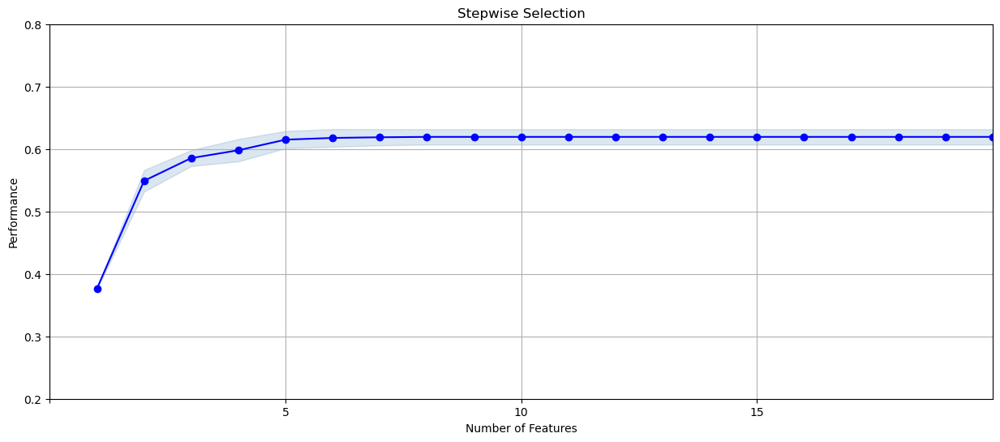

In [20]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
fig1 = plot_sfs(sfs.get_metric_dict(),kind='std_dev', figsize=(15, 6))
plt.xticks(np.arange(0, num_wrapper, step=5))
plt.yticks(np.arange(0,1,step=.1))
plt.ylim([.2,.8])
plt.xlim(0,num_wrapper)
plt.title('Stepwise Selection')
plt.grid()
plt.savefig('performance_nvars.png')
plt.show()

In [21]:
vars_FS = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

In [22]:
ordered_vars_FS = vars_FS.copy()
for i in range(len(ordered_vars_FS)):
    ordered_vars_FS.loc[i+1,'add variables in this order'] = int(i+1)
    if i+1 == 1:
        ordered_vars_FS.loc[i+1,'variable name'] = (list(ordered_vars_FS.loc[i+1,'feature_names'])[0])
    else:
        ordered_vars_FS.loc[i+1,'variable name'] = (list(set(ordered_vars_FS.loc[i+1,'feature_names']) - set(ordered_vars_FS.loc[i,'feature_names'])))[0]
# You might also need this following line. It converts a list to a string
#         ordered_vars_FS.loc[i+1,'variable name'] = ordered_vars_FS.loc[i+1,'variable name'][0]

In [23]:
ordered_vars_FS

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err,add variables in this order,variable name
1,"(1,)","[0.3777855153203343, 0.3750652968831621]",0.376425,"(max_count_by_address_30,)",0.005852,0.00136,0.00136,1.0,max_count_by_address_30
2,"(1, 84)","[0.5318593314763231, 0.5662545707818214]",0.549057,"(max_count_by_address_30, max_count_by_ssn_7)",0.073995,0.017198,0.017198,2.0,max_count_by_ssn_7
3,"(1, 79, 84)","[0.5725974930362117, 0.5982935747866969]",0.585446,"(max_count_by_address_30, max_count_by_homepho...",0.055281,0.012848,0.012848,3.0,max_count_by_homephone_7
4,"(1, 79, 84, 99)","[0.58008356545961, 0.6158802019850252]",0.597982,"(max_count_by_address_30, max_count_by_homepho...",0.07701,0.017898,0.017898,4.0,zip5_unique_count_for_dob_1
5,"(0, 1, 79, 84, 99)","[0.6011490250696379, 0.6287654535956817]",0.614957,"(max_count_by_fulladdress_30, max_count_by_add...",0.059412,0.013808,0.013808,5.0,max_count_by_fulladdress_30
6,"(0, 1, 79, 84, 99, 491)","[0.6035863509749304, 0.631899703987463]",0.617743,"(max_count_by_fulladdress_30, max_count_by_add...",0.060911,0.014157,0.014157,6.0,homephone_unique_count_for_fulladdress_14
7,"(0, 1, 79, 84, 99, 463, 491)","[0.6058495821727019, 0.6317255789656974]",0.618788,"(max_count_by_fulladdress_30, max_count_by_add...",0.055668,0.012938,0.012938,7.0,name_fulladdress_count_30
8,"(0, 1, 79, 84, 99, 463, 491, 560)","[0.6070682451253482, 0.6317255789656974]",0.619397,"(max_count_by_fulladdress_30, max_count_by_add...",0.053046,0.012329,0.012329,8.0,fulladdress_homephone_unique_count_for_zip5_60
9,"(0, 1, 6, 79, 84, 99, 463, 491, 560)","[0.6070682451253482, 0.6317255789656974]",0.619397,"(max_count_by_fulladdress_30, max_count_by_add...",0.053046,0.012329,0.012329,9.0,address_count_30
10,"(0, 1, 2, 6, 79, 84, 99, 463, 491, 560)","[0.6070682451253482, 0.6317255789656974]",0.619397,"(max_count_by_fulladdress_30, max_count_by_add...",0.053046,0.012329,0.012329,10.0,max_count_by_address_7


In [24]:
ordered_vars_FS.to_csv('Wrapper_selection_info.csv', index=False)

In [25]:
vars_keep = ordered_vars_FS['variable name']
vars_keep_list = ordered_vars_FS['variable name'].tolist()
vars_keep.to_csv('final_vars_list.csv',index=False)
vars_keep

1                            max_count_by_address_30
2                                 max_count_by_ssn_7
3                           max_count_by_homephone_7
4                        zip5_unique_count_for_dob_1
5                        max_count_by_fulladdress_30
6          homephone_unique_count_for_fulladdress_14
7                          name_fulladdress_count_30
8     fulladdress_homephone_unique_count_for_zip5_60
9                                   address_count_30
10                            max_count_by_address_7
11                             fulladdress_day_since
12                        max_count_by_fulladdress_3
13                            max_count_by_address_3
14                                  address_count_14
15                              fulladdress_count_14
16                            max_count_by_address_1
17                        max_count_by_fulladdress_1
18                                   address_count_7
19                               fulladdress_c

In [26]:
filter_score.set_index('variable',drop=True,inplace=True)
filter_score = filter_score.iloc[1:,:]
filter_score

,filter score
variable,
max_count_by_fulladdress_30,0.359914
max_count_by_address_30,0.359215
max_count_by_address_7,0.343335
max_count_by_fulladdress_7,0.343052
address_day_since,0.334140
...,...
name_homephone_unique_count_for_zip5_0,0.000005
name_fulladdress_unique_count_for_zip5_30,0.000001
ssn_fulladdress,0.000000


In [27]:
vars_keep_sorted = pd.DataFrame(vars_keep_list)
vars_keep_sorted.columns=['variable']
vars_keep_sorted.set_index('variable',drop=True,inplace=True)
vars_keep_sorted.head()

""
variable
max_count_by_address_30
max_count_by_ssn_7
max_count_by_homephone_7
zip5_unique_count_for_dob_1
max_count_by_fulladdress_30


In [28]:
vars_keep_sorted = pd.concat([vars_keep_sorted,filter_score],axis=1,join='inner')

In [29]:
vars_keep_sorted.reset_index(inplace=True)
vars_keep_sorted.reset_index(inplace=True)
vars_keep_sorted['index'] = vars_keep_sorted['index'] + 1
vars_keep_sorted.rename(columns={'index':'wrapper order'},inplace=True)
vars_keep_sorted.to_csv('vars_keep_sorted.csv',index=False)
vars_keep_sorted

,wrapper order,variable,filter score
0,1,max_count_by_address_30,0.359215
1,2,max_count_by_ssn_7,0.227428
2,3,max_count_by_homephone_7,0.232235
3,4,zip5_unique_count_for_dob_1,0.219066
4,5,max_count_by_fulladdress_30,0.359914
5,6,homephone_unique_count_for_fulladdress_14,0.054743
6,7,name_fulladdress_count_30,0.067691
7,8,fulladdress_homephone_unique_count_for_zip5_60,0.003806
8,9,address_count_30,0.332648
9,10,max_count_by_address_7,0.343335


In [30]:
vars_keep_list.append(index_name)
vars_keep_list.append(y_name)
vars_keep_list

['max_count_by_address_30',
 'max_count_by_ssn_7',
 'max_count_by_homephone_7',
 'zip5_unique_count_for_dob_1',
 'max_count_by_fulladdress_30',
 'homephone_unique_count_for_fulladdress_14',
 'name_fulladdress_count_30',
 'fulladdress_homephone_unique_count_for_zip5_60',
 'address_count_30',
 'max_count_by_address_7',
 'fulladdress_day_since',
 'max_count_by_fulladdress_3',
 'max_count_by_address_3',
 'address_count_14',
 'fulladdress_count_14',
 'max_count_by_address_1',
 'max_count_by_fulladdress_1',
 'address_count_7',
 'fulladdress_count_7',
 'address_count_0_by_30',
 'record',
 'fraud_label']

In [31]:
filter_score

,filter score
variable,
max_count_by_fulladdress_30,0.359914
max_count_by_address_30,0.359215
max_count_by_address_7,0.343335
max_count_by_fulladdress_7,0.343052
address_day_since,0.334140
...,...
name_homephone_unique_count_for_zip5_0,0.000005
name_fulladdress_unique_count_for_zip5_30,0.000001
ssn_fulladdress,0.000000


In [32]:
%%time
df = pd.read_csv(file_name)
df.shape

CPU times: total: 14.7 s
Wall time: 24.8 s


(1000000, 654)

In [33]:
df_keep = df.filter(vars_keep_list, axis=1)
# df_keep = df[df.index.isin(vars_keep_list)]
print(df_keep.shape)

(1000000, 22)


In [34]:
df_keep.to_csv('vars_final.csv',index=False)

In [35]:
print("duration: ", dt.datetime.now() - start_time)

duration:  2:15:23.034620


In [36]:
%pwd

'C:\\Users\\Yixuan Liu\\Downloads\\DSO 562\\Project 2'